In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from platform import python_version
'Python ' + python_version()
import numpy as np
import pandas as pd
import gc
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.callbacks import TensorBoard

In [2]:
#Importación de dataset
datos, metadatos = tfds.load('cats_vs_dogs', as_supervised=True, with_info=True)
tamañoimg = 150
metadatos

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/4.0.1.incompleteFC4DNF/cats_vs_dogs-train.tfrecord*...:   0%|…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.


tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.1',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_dir=PosixGPath('/tmp/tmpqjtrlgrgtfds'),
    file_format=tfrecord,
    download_size=786.67 MiB,
    dataset_size=1.04 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=16>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
    

<Figure size 2000x2000 with 0 Axes>

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

<Axes: >

([], [])

([], [])

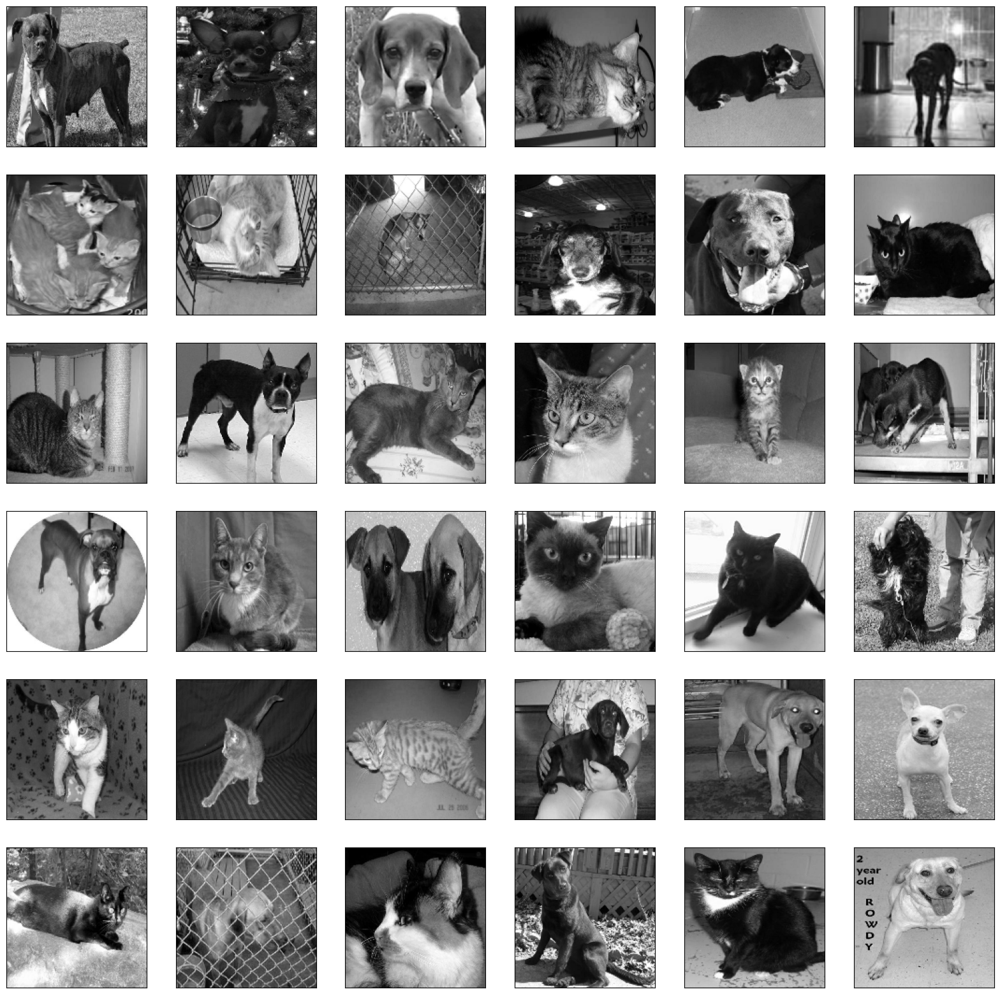

In [ ]:
plt.figure(figsize=(20,20))

for i, (imagen, etiqueta) in enumerate(datos['train'].take(36)):
  imagen = cv2.resize(imagen.numpy(), (tamañoimg, tamañoimg))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  plt.subplot(6, 6, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen, cmap='gray')


<BarContainer object of 2 artists>

Text(0.5, 0, 'Clase')

Text(0, 0.5, 'Cantidad de imágenes')

Text(0.5, 1.0, 'Cantidad de imágenes de perros y gatos')

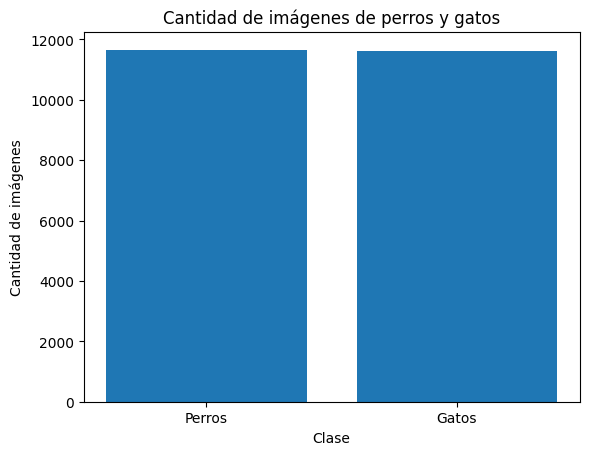

(20000, 150, 150, 1)

(20000,)

Numero de perros :  11658
Numero de gatos :  11604


In [3]:
datos_entrenamiento = []

# Contadores para perros y gatos
contador_perros = 0
contador_gatos = 0

for i, (imagen, etiqueta) in enumerate(datos['train']):
  imagen = cv2.resize(imagen.numpy(), (tamañoimg, tamañoimg))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  # Fijo el tamaño LARGO X ANCHO X 1
  imagen = imagen.reshape(tamañoimg, tamañoimg, 1)
  datos_entrenamiento.append([imagen, etiqueta])
  #Contador de perros y gatos
  if etiqueta == 0:  # Perro
        contador_perros += 1
  else:  # Gato
        contador_gatos += 1

# Crear la gráfica de barras
categorias = ['Perros', 'Gatos']
conteos = [contador_perros, contador_gatos]

plt.bar(categorias, conteos)
plt.xlabel('Clase')
plt.ylabel('Cantidad de imágenes')
plt.title('Cantidad de imágenes de perros y gatos')
plt.show()

# Datos de entrada
X = []
# Etiquetas de perro y gato
Y = []

datos_entrenamiento=datos_entrenamiento[:20000]

for imagen, etiqueta in datos_entrenamiento:
  X.append(imagen)
  Y.append(etiqueta)

X = np.array(X).astype(float) / 255
Y = np.array(Y)

X.shape
Y.shape

print("Numero de perros : ",contador_perros)
print("Numero de gatos : ",contador_gatos)

In [4]:
gc.collect()
# Limitar el tamaño total de la data a 20,000 muestras
X_limited = X[:20000]
Y_limited = Y[:20000]

# Dividir la data en 80% entrenamiento, 20% validación y 20% prueba
train_size = int(0.8 * len(X_limited))
val_size = int(0.2 * len(X_limited) / 2)  # Dividimos el 20% restante en mitades para validación y prueba

X_train, X_valtest, y_train, y_valtest = X_limited[:train_size], X_limited[train_size:], Y_limited[:train_size], Y_limited[train_size:]
X_val, X_test, y_val, y_test = X_valtest[:val_size], X_valtest[val_size:], y_valtest[:val_size], y_valtest[val_size:]

# Verificar las formas de los conjuntos de datos resultantes
print("Tamaño del conjunto de entrenamiento:", X_train.shape)
print("Tamaño del conjunto de validación:", X_val.shape)
print("Tamaño del conjunto de prueba:", X_test.shape)

0

Tamaño del conjunto de entrenamiento: (16000, 150, 150, 1)
Tamaño del conjunto de validación: (2000, 150, 150, 1)
Tamaño del conjunto de prueba: (2000, 150, 150, 1)


In [5]:
modeloDenso = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
    tf.keras.layers.Dense(150, activation = 'relu'),
    tf.keras.layers.Dense(150, activation = 'relu'),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

modeloCNN = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3), activation ='relu', input_shape=(100, 100, 1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3), activation ='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3), activation ='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

modeloCNN2 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3), activation ='relu', input_shape=(100, 100, 1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3), activation ='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3), activation ='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(250, activation = 'relu'),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

modeloDenso.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
modeloCNN.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
modeloCNN2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
tensorboardDenso = TensorBoard(log_dir='logs/denso')
modeloDenso.fit(X, Y, batch_size=32, validation_split=0.15, epochs=100, callbacks=[tensorboardDenso])

Epoch 1/100
618/618 [==============================] - 6s 5ms/step - loss: 0.7094 - accuracy: 0.5459 - val_loss: 0.6725 - val_accuracy: 0.5848
Epoch 2/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6758 - accuracy: 0.5704 - val_loss: 0.6652 - val_accuracy: 0.6026
Epoch 3/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6718 - accuracy: 0.5825 - val_loss: 0.6692 - val_accuracy: 0.5891
Epoch 4/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6672 - accuracy: 0.5912 - val_loss: 0.6654 - val_accuracy: 0.5989
Epoch 5/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6623 - accuracy: 0.5972 - val_loss: 0.6693 - val_accuracy: 0.5923
Epoch 6/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6623 - accuracy: 0.5988 - val_loss: 0.6677 - val_accuracy: 0.6009
Epoch 7/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6591 - accuracy: 0.6064 - val_loss: 0.6569 - val_accuracy: 0.6160

In [ ]:
tensorboardCNN = TensorBoard(log_dir='logs/CNN')
modeloCNN.fit(X, Y, batch_size=32, validation_split=0.15, epochs=100, callbacks=[tensorboardCNN])

Epoch 1/100
618/618 [==============================] - 13s 14ms/step - loss: 0.5987 - accuracy: 0.6665 - val_loss: 0.5073 - val_accuracy: 0.7524
Epoch 2/100
618/618 [==============================] - 7s 12ms/step - loss: 0.4682 - accuracy: 0.7775 - val_loss: 0.4454 - val_accuracy: 0.7891
Epoch 3/100
618/618 [==============================] - 7s 12ms/step - loss: 0.3970 - accuracy: 0.8179 - val_loss: 0.4447 - val_accuracy: 0.7971
Epoch 4/100
618/618 [==============================] - 7s 12ms/step - loss: 0.3387 - accuracy: 0.8527 - val_loss: 0.3834 - val_accuracy: 0.8307
Epoch 5/100
618/618 [==============================] - 7s 12ms/step - loss: 0.2855 - accuracy: 0.8801 - val_loss: 0.3998 - val_accuracy: 0.8246
Epoch 6/100
618/618 [==============================] - 7s 12ms/step - loss: 0.2242 - accuracy: 0.9056 - val_loss: 0.3971 - val_accuracy: 0.8427
Epoch 7/100
618/618 [==============================] - 7s 12ms/step - loss: 0.1611 - accuracy: 0.9365 - val_loss: 0.4337 - val_accuracy

KeyboardInterrupt: 

In [ ]:
tensorboardCNN2 = TensorBoard(log_dir='logs/CNN2')
modeloCNN2.fit(X, Y, batch_size=32, validation_split=0.15, epochs=100, callbacks=[tensorboardCNN2])

In [6]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

modeloCNN = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),  # Nueva capa de convolución
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Dropout(0.1),  # Añadimos una capa de dropout para regularización
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(400, activation='relu'),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
modeloCNN.summary()
modeloCNN.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 148, 148, 32)      320       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 74, 74, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 36, 36, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 17, 17, 128)      

In [ ]:
# 1 Capas Conv - 20 neuronas
tensorboardDenso = TensorBoard(log_dir='logs/denso')
modeloCNN.fit(X_train, y_train,
               batch_size=32,
               epochs=10,
               validation_data=(X_val, y_val),
               callbacks=[tensorboardDenso])

Epoch 1/10
8000/8000 [==============================] - 39s 4ms/step - loss: 0.6942 - accuracy: 0.5034 - val_loss: 0.6931 - val_accuracy: 0.5045
Epoch 2/10
8000/8000 [==============================] - 35s 4ms/step - loss: 0.6932 - accuracy: 0.5005 - val_loss: 0.6931 - val_accuracy: 0.5045
Epoch 3/10
8000/8000 [==============================] - 35s 4ms/step - loss: 0.6932 - accuracy: 0.5021 - val_loss: 0.6931 - val_accuracy: 0.5045
Epoch 4/10
8000/8000 [==============================] - 35s 4ms/step - loss: 0.6932 - accuracy: 0.5077 - val_loss: 0.6933 - val_accuracy: 0.4955
Epoch 5/10
8000/8000 [==============================] - 35s 4ms/step - loss: 0.6933 - accuracy: 0.4996 - val_loss: 0.6931 - val_accuracy: 0.5045
Epoch 6/10
8000/8000 [==============================] - 35s 4ms/step - loss: 0.6931 - accuracy: 0.5049 - val_loss: 0.6932 - val_accuracy: 0.4955
Epoch 7/10
8000/8000 [==============================] - 34s 4ms/step - loss: 0.6931 - accuracy: 0.4956 - val_loss: 0.6934 - val_ac

In [ ]:
# 1 Capas Conv - 28 neuronas
tensorboardDenso = TensorBoard(log_dir='logs/denso')
modeloCNN.fit(X_train, y_train,
               batch_size=32,
               epochs=10,
               validation_data=(X_val, y_val),
               callbacks=[tensorboardDenso])

Epoch 1/10
8000/8000 [==============================] - 41s 5ms/step - loss: 0.6299 - accuracy: 0.6488 - val_loss: 0.5758 - val_accuracy: 0.7160
Epoch 2/10
8000/8000 [==============================] - 41s 5ms/step - loss: 0.5030 - accuracy: 0.7552 - val_loss: 0.5939 - val_accuracy: 0.7080
Epoch 3/10
8000/8000 [==============================] - 37s 5ms/step - loss: 0.3794 - accuracy: 0.8301 - val_loss: 0.6689 - val_accuracy: 0.7060
Epoch 4/10
8000/8000 [==============================] - 37s 5ms/step - loss: 0.2391 - accuracy: 0.8996 - val_loss: 0.9609 - val_accuracy: 0.7025
Epoch 5/10
8000/8000 [==============================] - 36s 4ms/step - loss: 0.1309 - accuracy: 0.9488 - val_loss: 1.4273 - val_accuracy: 0.6985
Epoch 6/10
8000/8000 [==============================] - 37s 5ms/step - loss: 0.0777 - accuracy: 0.9723 - val_loss: 1.9952 - val_accuracy: 0.6830
Epoch 7/10
8000/8000 [==============================] - 37s 5ms/step - loss: 0.0592 - accuracy: 0.9799 - val_loss: 2.1058 - val_ac

In [7]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
gc.collect()
parameters = {'eval_batch_size': 32,
              'batch_size': 32,
              'epochs': 6,
              'dropout': 0.0,
              'optimizer': 'Adam',
              'loss': 'binary_crossentropy',
              'activation':'sigmoid'}

def dogCatCNN(x_train, y_train, x_val, y_val, params):
    model = Sequential(name="dog_cat_CNN")
    model.add(Conv2D(filters=32, kernel_size=(3,3), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)))
    model.add(MaxPooling2D(2, 2))
    model.add(Flatten())
    model.add(Dense(28, activation='relu'))
    model.add(Dense(1, activation=params['activation']))
    model.compile(loss=params['loss'],
                  optimizer=params['optimizer'],
                  metrics=['accuracy'])
    print(model.summary())
    model.fit(x_train,
              y_train,
              validation_data=(x_val, y_val),
              batch_size=params['batch_size'],
              epochs=params['epochs'])
    return model

dog_cat_CNN = dogCatCNN(X_train, y_train, X_val, y_val, parameters)

4095

Model: "dog_cat_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 148, 148, 32)      320       
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 74, 74, 32)        0         
 ng2D)                                                           
                                                                 
 flatten_4 (Flatten)         (None, 175232)            0         
                                                                 
 dense_10 (Dense)            (None, 28)                4906524   
                                                                 
 dense_11 (Dense)            (None, 1)                 29        
                                                                 
Total params: 4906873 (18.72 MB)
Trainable params: 4906873 (18.72 MB)
Non-trainable params: 0 (0.00 Byte)
_______________

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
gc.collect()
parameters = {'eval_batch_size': 32,
              'batch_size': 32,
              'epochs': 6,
              'dropout': 0.2,
              'optimizer': 'Adam',
              'loss': 'binary_crossentropy',
              'activation':'sigmoid'}

def dogCatCNN(x_train, y_train, x_val, y_val, params):
    model = Sequential(name="dog_cat_CNN")
    model.add(Conv2D(filters=32, kernel_size=(2,2), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)))
    model.add(MaxPooling2D(2, 2))
    model.add(Flatten())
    #model.add(Dropout(params['dropout']))
    model.add(Dense(28, activation='relu'))
    model.add(Dense(1, activation=params['activation']))
    model.compile(loss=params['loss'],
                  optimizer=params['optimizer'],
                  metrics=['accuracy'])
    print(model.summary())
    model.fit(x_train,
              y_train,
              validation_data=(x_val, y_val),
              batch_size=params['batch_size'],
              epochs=params['epochs'])
    return model

dog_cat_CNN = dogCatCNN(X_train, y_train, X_val, y_val, parameters)

3508

Model: "dog_cat_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 149, 149, 32)      160       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 74, 74, 32)        0         
 g2D)                                                            
                                                                 
 flatten_4 (Flatten)         (None, 175232)            0         
                                                                 
 dense_9 (Dense)             (None, 28)                4906524   
                                                                 
 dense_10 (Dense)            (None, 1)                 29        
                                                                 
Total params: 4906713 (18.72 MB)
Trainable params: 4906713 (18.72 MB)
Non-trainable params: 0 (0.00 Byte)
_______________

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
gc.collect()
parameters = {'eval_batch_size': 32,
              'batch_size': 32,
              'epochs': 6,
              'dropout': 0.2,
              'optimizer': 'Adam',
              'loss': 'binary_crossentropy',
              'activation':'sigmoid'}

def dogCatCNN(x_train, y_train, x_val, y_val, params):
    model = Sequential(name="dog_cat_CNN")
    model.add(Conv2D(filters=32, kernel_size=(3,3), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)))
    model.add(MaxPooling2D(2, 2))
    model.add(Flatten())
    model.add(Dense(28, activation='relu'))
    model.add(Dropout(params['dropout']))
    model.add(Dense(1, activation=params['activation']))
    model.compile(loss=params['loss'],
                  optimizer=params['optimizer'],
                  metrics=['accuracy'])
    print(model.summary())
    model.fit(x_train,
              y_train,
              validation_data=(x_val, y_val),
              batch_size=params['batch_size'],
              epochs=params['epochs'])
    return model

dog_cat_CNN = dogCatCNN(X_train, y_train, X_val, y_val, parameters)

3443

Model: "dog_cat_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 148, 148, 32)      320       
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 74, 74, 32)        0         
 ng2D)                                                           
                                                                 
 flatten_6 (Flatten)         (None, 175232)            0         
                                                                 
 dense_13 (Dense)            (None, 28)                4906524   
                                                                 
 dropout_3 (Dropout)         (None, 28)                0         
                                                                 
 dense_14 (Dense)            (None, 1)                 29        
                                                       

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
gc.collect()
parameters = {'eval_batch_size': 32,
              'batch_size': 32,
              'epochs': 6,
              'dropout': 0.2,
              'optimizer': 'Adam',
              'loss': 'binary_crossentropy',
              'activation':'sigmoid'}

def dogCatCNN(x_train, y_train, x_val, y_val, params):
    model = Sequential(name="dog_cat_CNN")
    model.add(Conv2D(filters=32, kernel_size=(3,3), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Flatten())
    #model.add(Dropout(params['dropout']))
    model.add(Dense(28, activation='relu'))
    model.add(Dense(1, activation=params['activation']))
    model.compile(loss=params['loss'],
                  optimizer=params['optimizer'],
                  metrics=['accuracy'])
    print(model.summary())
    model.fit(x_train,
              y_train,
              validation_data=(x_val, y_val),
              batch_size=params['batch_size'],
              epochs=params['epochs'])
    return model

dog_cat_CNN = dogCatCNN(X_train, y_train, X_val, y_val, parameters)

3066

Model: "dog_cat_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 148, 148, 32)      320       
                                                                 
 max_pooling2d_18 (MaxPooli  (None, 74, 74, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_19 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_19 (MaxPooli  (None, 36, 36, 64)        0         
 ng2D)                                                           
                                                                 
 flatten_10 (Flatten)        (None, 82944)             0         
                                                                 
 dense_21 (Dense)            (None, 28)                

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
gc.collect()
parameters = {'eval_batch_size': 32,
              'batch_size': 32,
              'epochs': 6,
              'dropout': 0.1,
              'optimizer': 'Adam',
              'loss': 'binary_crossentropy',
              'activation':'sigmoid'}

def dogCatCNN(x_train, y_train, x_val, y_val, params):
    model = Sequential(name="dog_cat_CNN")
    model.add(Conv2D(filters=32, kernel_size=(3,3), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Flatten())
    model.add(Dropout(params['dropout']))
    model.add(Dense(28, activation='relu'))
    model.add(Dense(1, activation=params['activation']))
    model.compile(loss=params['loss'],
                  optimizer=params['optimizer'],
                  metrics=['accuracy'])
    print(model.summary())
    model.fit(x_train,
              y_train,
              validation_data=(x_val, y_val),
              batch_size=params['batch_size'],
              epochs=params['epochs'])
    return model

dog_cat_CNN = dogCatCNN(X_train, y_train, X_val, y_val, parameters)

3982

Model: "dog_cat_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 148, 148, 32)      320       
                                                                 
 max_pooling2d_20 (MaxPooli  (None, 74, 74, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_21 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 36, 36, 64)        0         
 ng2D)                                                           
                                                                 
 flatten_11 (Flatten)        (None, 82944)             0         
                                                                 
 dropout_7 (Dropout)         (None, 82944)             

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
gc.collect()
parameters = {'eval_batch_size': 32,
              'batch_size': 32,
              'epochs': 6,
              'dropout': 0.1,
              'optimizer': 'Adam',
              'loss': 'binary_crossentropy',
              'activation':'sigmoid'}

def dogCatCNN(x_train, y_train, x_val, y_val, params):
    model = Sequential(name="dog_cat_CNN")
    model.add(Conv2D(filters=32, kernel_size=(2,2), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Flatten())
    model.add(Dropout(params['dropout']))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation=params['activation']))
    model.compile(loss=params['loss'],
                  optimizer=params['optimizer'],
                  metrics=['accuracy'])
    print(model.summary())
    model.fit(x_train,
              y_train,
              validation_data=(x_val, y_val),
              batch_size=params['batch_size'],
              epochs=params['epochs'])
    return model

dog_cat_CNN = dogCatCNN(X_train, y_train, X_val, y_val, parameters)

3684

Model: "dog_cat_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_22 (Conv2D)          (None, 149, 149, 32)      160       
                                                                 
 max_pooling2d_22 (MaxPooli  (None, 74, 74, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_23 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_23 (MaxPooli  (None, 36, 36, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_24 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_24 (MaxPooli  (None, 17, 17, 128)       

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
gc.collect()
parameters = {'eval_batch_size': 32,
              'batch_size': 32,
              'epochs': 6,
              'dropout': 0.1,
              'optimizer': 'Adam',
              'loss': 'binary_crossentropy',
              'activation':'sigmoid'}

def dogCatCNN(x_train, y_train, x_val, y_val, params):
    model = Sequential(name="dog_cat_CNN")
    model.add(Conv2D(filters=32, kernel_size=(2,2), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=64, kernel_size=(2,2), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=128, kernel_size=(2,2), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)))
    model.add(MaxPooling2D(2, 2))
    model.add(Flatten())
    model.add(Dropout(params['dropout']))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation=params['activation']))
    model.compile(loss=params['loss'],
                  optimizer=params['optimizer'],
                  metrics=['accuracy'])
    print(model.summary())
    model.fit(x_train,
              y_train,
              validation_data=(x_val, y_val),
              batch_size=params['batch_size'],
              epochs=params['epochs'])
    return model

dog_cat_CNN = dogCatCNN(X_train, y_train, X_val, y_val, parameters)

3745

Model: "dog_cat_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_25 (Conv2D)          (None, 149, 149, 32)      160       
                                                                 
 max_pooling2d_25 (MaxPooli  (None, 74, 74, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_26 (Conv2D)          (None, 73, 73, 64)        8256      
                                                                 
 max_pooling2d_26 (MaxPooli  (None, 36, 36, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_27 (Conv2D)          (None, 35, 35, 128)       32896     
                                                                 
 max_pooling2d_27 (MaxPooli  (None, 17, 17, 128)       

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
gc.collect()
parameters = {'eval_batch_size': 32,
              'batch_size': 32,
              'epochs': 6,
              'dropout': 0.2,
              'optimizer': 'Adam',
              'loss': 'binary_crossentropy',
              'activation':'sigmoid'}

def dogCatCNN(x_train, y_train, x_val, y_val, params):
    model = Sequential(name="dog_cat_CNN")
    model.add(Conv2D(filters=32, kernel_size=(2,2), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Flatten())
    model.add(Dropout(params['dropout']))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(params['dropout']))
    model.add(Dense(1, activation=params['activation']))
    model.compile(loss=params['loss'],
                  optimizer=params['optimizer'],
                  metrics=['accuracy'])
    print(model.summary())
    model.fit(x_train,
              y_train,
              validation_data=(x_val, y_val),
              batch_size=params['batch_size'],
              epochs=params['epochs'])
    return model

dog_cat_CNN = dogCatCNN(X_train, y_train, X_val, y_val, parameters)

1329

Model: "dog_cat_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_40 (Conv2D)          (None, 149, 149, 32)      160       
                                                                 
 max_pooling2d_40 (MaxPooli  (None, 74, 74, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_41 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_41 (MaxPooli  (None, 36, 36, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_42 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_42 (MaxPooli  (None, 17, 17, 128)       

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
gc.collect()
parameters = {'eval_batch_size': 32,
              'batch_size': 32,
              'epochs': 6,
              'dropout': 0.1,
              'optimizer': 'Adam',
              'loss': 'binary_crossentropy',
              'activation':'sigmoid'}

def dogCatCNN(x_train, y_train, x_val, y_val, params):
    model = Sequential(name="dog_cat_CNN")
    model.add(Conv2D(filters=32, kernel_size=(2,2), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Flatten())
    model.add(Dense(32, activation='relu'))
    model.add(Dense(16, activation='relu'))
    model.add(Dense(1, activation=params['activation']))
    model.compile(loss=params['loss'],
                  optimizer=params['optimizer'],
                  metrics=['accuracy'])
    print(model.summary())
    model.fit(x_train,
              y_train,
              validation_data=(x_val, y_val),
              batch_size=params['batch_size'],
              epochs=params['epochs'])
    return model

dog_cat_CNN = dogCatCNN(X_train, y_train, X_val, y_val, parameters)

3978

Model: "dog_cat_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_31 (Conv2D)          (None, 149, 149, 32)      160       
                                                                 
 max_pooling2d_31 (MaxPooli  (None, 74, 74, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_32 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_32 (MaxPooli  (None, 36, 36, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_33 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_33 (MaxPooli  (None, 17, 17, 128)       

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
gc.collect()
parameters = {'eval_batch_size': 32,
              'batch_size': 32,
              'epochs': 6,
              'dropout': 0.3,
              'optimizer': 'Adam',
              'loss': 'binary_crossentropy',
              'activation':'sigmoid'}

def dogCatCNN(x_train, y_train, x_val, y_val, params):
    model = Sequential(name="dog_cat_CNN")
    model.add(Conv2D(filters=32, kernel_size=(2,2), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(1, activation=params['activation']))
    model.compile(loss=params['loss'],
                  optimizer=params['optimizer'],
                  metrics=['accuracy'])
    print(model.summary())
    model.fit(x_train,
              y_train,
              validation_data=(x_val, y_val),
              batch_size=params['batch_size'],
              epochs=params['epochs'])
    return model

dog_cat_CNN = dogCatCNN(X_train, y_train, X_val, y_val, parameters)

4100

Model: "dog_cat_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_52 (Conv2D)          (None, 149, 149, 32)      160       
                                                                 
 max_pooling2d_52 (MaxPooli  (None, 74, 74, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_53 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_53 (MaxPooli  (None, 36, 36, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_54 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_54 (MaxPooli  (None, 17, 17, 128)       

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
gc.collect()
parameters = {'eval_batch_size': 32,
              'batch_size': 32,
              'epochs': 6,
              'dropout': 0.3,
              'optimizer': 'Adam',
              'loss': 'binary_crossentropy',
              'activation':'sigmoid'}

def dogCatCNN(x_train, y_train, x_val, y_val, params):
    model = Sequential(name="dog_cat_CNN")
    model.add(Conv2D(filters=32, kernel_size=(2,2), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(params['dropout']))
    model.add(Dense(1, activation=params['activation']))
    model.compile(loss=params['loss'],
                  optimizer=params['optimizer'],
                  metrics=['accuracy'])
    print(model.summary())
    model.fit(x_train,
              y_train,
              validation_data=(x_val, y_val),
              batch_size=params['batch_size'],
              epochs=params['epochs'])
    return model

dog_cat_CNN = dogCatCNN(X_train, y_train, X_val, y_val, parameters)

3243

Model: "dog_cat_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_58 (Conv2D)          (None, 149, 149, 32)      160       
                                                                 
 max_pooling2d_58 (MaxPooli  (None, 74, 74, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_59 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_59 (MaxPooli  (None, 36, 36, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_60 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_60 (MaxPooli  (None, 17, 17, 128)       

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
gc.collect()
parameters = {'eval_batch_size': 32,
              'batch_size': 32,
              'epochs': 10,
              'dropout': 0.3,
              'optimizer': 'Adam',
              'loss': 'binary_crossentropy',
              'activation':'sigmoid'}

def dogCatCNN(x_train, y_train, x_val, y_val, params):
    model = Sequential(name="dog_cat_CNN")
    model.add(Conv2D(filters=16, kernel_size=(2,2), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)))
    model.add(MaxPooling2D(4, 4))
    model.add(Conv2D(filters=32, kernel_size=(2,2), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(1, activation=params['activation']))
    model.compile(loss=params['loss'],
                  optimizer=params['optimizer'],
                  metrics=['accuracy'])
    print(model.summary())
    model.fit(x_train,
              y_train,
              validation_data=(x_val, y_val),
              batch_size=params['batch_size'],
              epochs=params['epochs'])
    return model

dog_cat_CNN = dogCatCNN(X_train, y_train, X_val, y_val, parameters)

4153

Model: "dog_cat_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_73 (Conv2D)          (None, 149, 149, 16)      80        
                                                                 
 max_pooling2d_73 (MaxPooli  (None, 37, 37, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_74 (Conv2D)          (None, 36, 36, 32)        2080      
                                                                 
 max_pooling2d_74 (MaxPooli  (None, 18, 18, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_75 (Conv2D)          (None, 16, 16, 64)        18496     
                                                                 
 max_pooling2d_75 (MaxPooli  (None, 8, 8, 64)          

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
gc.collect()
parameters = {'eval_batch_size': 32,
              'batch_size': 32,
              'epochs': 10,
              'dropout': 0.4,
              'optimizer': 'Adam',
              'loss': 'binary_crossentropy',
              'activation':'sigmoid'}

def dogCatCNN(x_train, y_train, x_val, y_val, params):
    model = Sequential(name="dog_cat_CNN")
    model.add(Conv2D(filters=16, kernel_size=(2,2), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)))
    model.add(MaxPooling2D(4, 4))
    model.add(Conv2D(filters=32, kernel_size=(2,2), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Flatten())
    model.add(Dropout(params['dropout']))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(1, activation=params['activation']))
    model.compile(loss=params['loss'],
                  optimizer=params['optimizer'],
                  metrics=['accuracy'])
    print(model.summary())
    model.fit(x_train,
              y_train,
              validation_data=(x_val, y_val),
              batch_size=params['batch_size'],
              epochs=params['epochs'])
    return model

dog_cat_CNN = dogCatCNN(X_train, y_train, X_val, y_val, parameters)

1325

Model: "dog_cat_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_44 (Conv2D)          (None, 149, 149, 16)      80        
                                                                 
 max_pooling2d_44 (MaxPooli  (None, 37, 37, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_45 (Conv2D)          (None, 36, 36, 32)        2080      
                                                                 
 max_pooling2d_45 (MaxPooli  (None, 18, 18, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_46 (Conv2D)          (None, 16, 16, 64)        18496     
                                                                 
 max_pooling2d_46 (MaxPooli  (None, 8, 8, 64)          

In [8]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
gc.collect()
parameters = {'eval_batch_size': 32,
              'batch_size': 32,
              'epochs': 10,
              'dropout': 0.4,
              'optimizer': 'Adam',
              'loss': 'binary_crossentropy',
              'activation':'sigmoid'}

def dogCatCNN(x_train, y_train, x_val, y_val, params):
    model = Sequential(name="dog_cat_CNN")
    model.add(Conv2D(filters=16, kernel_size=(2,2), activation='relu', input_shape=(tamañoimg, tamañoimg, 1)))
    model.add(MaxPooling2D(4, 4))
    model.add(Conv2D(filters=32, kernel_size=(2,2), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(2, 2))
    model.add(Flatten())
    model.add(Dropout(params['dropout']))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation=params['activation']))
    model.compile(loss=params['loss'],
                  optimizer=params['optimizer'],
                  metrics=['accuracy'])
    print(model.summary())
    model.fit(x_train,
              y_train,
              validation_data=(x_val, y_val),
              batch_size=params['batch_size'],
              epochs=params['epochs'])
    return model

dog_cat_CNN = dogCatCNN(X_train, y_train, X_val, y_val, parameters)

1329

Model: "dog_cat_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_11 (Conv2D)          (None, 149, 149, 16)      80        
                                                                 
 max_pooling2d_11 (MaxPooli  (None, 37, 37, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_12 (Conv2D)          (None, 36, 36, 32)        2080      
                                                                 
 max_pooling2d_12 (MaxPooli  (None, 18, 18, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_13 (Conv2D)          (None, 16, 16, 64)        18496     
                                                                 
 max_pooling2d_13 (MaxPooli  (None, 8, 8, 64)          

In [ ]:
gc.collect()
# 4 Capas Conv - 400 neuronas - 100 neuronas - Dropout  - batch 22
tensorboardDenso = TensorBoard(log_dir='logs/denso')
modeloCNN.fit(X_train, y_train,
               batch_size=38,
               epochs=10,
               validation_data=(X_val, y_val),
               callbacks=[tensorboardDenso])

5545

Epoch 1/10
422/422 [==============================] - 22s 42ms/step - loss: 0.6831 - accuracy: 0.5517 - val_loss: 0.6663 - val_accuracy: 0.6365
Epoch 2/10
422/422 [==============================] - 16s 39ms/step - loss: 0.5951 - accuracy: 0.6851 - val_loss: 0.6868 - val_accuracy: 0.6470
Epoch 3/10
422/422 [==============================] - 16s 38ms/step - loss: 0.4970 - accuracy: 0.7555 - val_loss: 0.4642 - val_accuracy: 0.7745
Epoch 4/10
422/422 [==============================] - 16s 39ms/step - loss: 0.3983 - accuracy: 0.8179 - val_loss: 0.6106 - val_accuracy: 0.7230
Epoch 5/10
422/422 [==============================] - 17s 39ms/step - loss: 0.3624 - accuracy: 0.8388 - val_loss: 0.3717 - val_accuracy: 0.8335
Epoch 6/10
422/422 [==============================] - 17s 39ms/step - loss: 0.2804 - accuracy: 0.8793 - val_loss: 0.3670 - val_accuracy: 0.8450
Epoch 7/10
422/422 [==============================] - 17s 39ms/step - loss: 0.2087 - accuracy: 0.9132 - val_loss: 0.3963 - val_accuracy:

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
# Realiza predicciones en el conjunto de prueba
predictions = modeloCNN.predict(X_test)

# Convertir las probabilidades en etiquetas (0 o 1) si es un problema de clasificación binaria
predicted_labels = (predictions > 0.5).astype(int)

# Ahora puedes evaluar las predicciones comparándolas con las etiquetas verdaderas
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, predicted_labels)
precision = precision_score(y_test, predicted_labels)
recall = recall_score(y_test, predicted_labels)
f1 = f1_score(y_test, predicted_labels)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)



63/63 [==============================] - 1s 10ms/step
Accuracy: 0.848
Precision: 0.8739754098360656
Recall: 0.8249516441005803
F1 Score: 0.8487562189054726


In [9]:
# Realiza predicciones en el conjunto de prueba
predictions = dog_cat_CNN.predict(X_test)

# Convertir las probabilidades en etiquetas (0 o 1) si es un problema de clasificación binaria
predicted_labels = (predictions > 0.5).astype(int)

# Ahora puedes evaluar las predicciones comparándolas con las etiquetas verdaderas
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, predicted_labels)
precision = precision_score(y_test, predicted_labels)
recall = recall_score(y_test, predicted_labels)
f1 = f1_score(y_test, predicted_labels)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

63/63 [==============================] - 0s 3ms/step
Accuracy: 0.8725
Precision: 0.8748796920115496
Recall: 0.879110251450677
F1 Score: 0.8769898697539797


<Figure size 1500x600 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'Predicción: [1] (Perro)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [1] (Perro)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [1] (Perro)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [1] (Perro)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [1] (Perro)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [1] (Perro)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [1] (Perro)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [1] (Perro)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [1] (Perro)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [1] (Perro)')

(-0.5, 149.5, 149.5, -0.5)

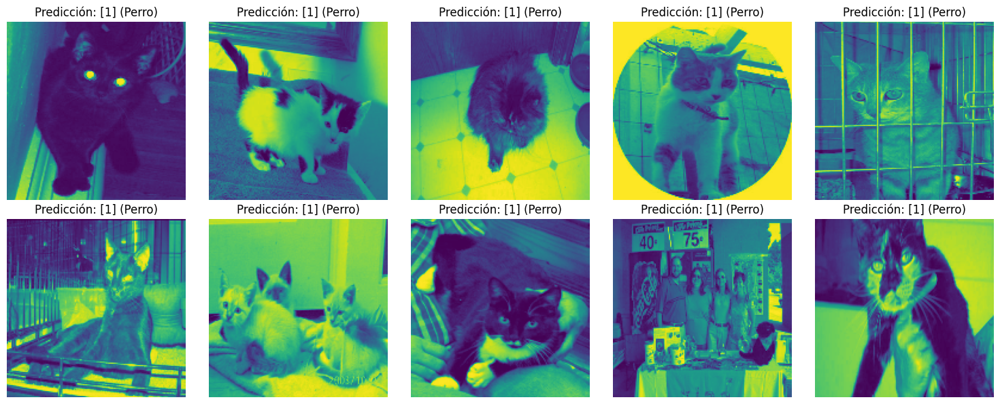

In [ ]:
import random
# Identificar índices de imágenes donde se predijo incorrectamente que es un perro
indices_perro_incorrecto = [i for i, (verdadero, predicho) in enumerate(zip(y_test, predicted_labels)) if verdadero == 0 and predicho == 1]

# Configurar el tamaño de la cuadrícula y la cantidad de ejemplos a mostrar
filas = 2
columnas = 5
num_ejemplos = filas * columnas

# Seleccionar índices aleatorios de imágenes de perros incorrectamente clasificadas
indices_mostrar = random.sample(indices_perro_incorrecto, min(num_ejemplos, len(indices_perro_incorrecto)))

# Mostrar las imágenes
plt.figure(figsize=(15, 6))
for i, idx in enumerate(indices_mostrar, 1):
    plt.subplot(filas, columnas, i)
    plt.imshow(X_test[idx])  # Muestra la imagen
    plt.title(f"Predicción: {predicted_labels[idx]} (Perro)")
    plt.axis('off')
plt.tight_layout()
plt.show()


<Figure size 1500x600 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'Predicción: [0] (Gato)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [0] (Gato)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [0] (Gato)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [0] (Gato)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [0] (Gato)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [0] (Gato)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [0] (Gato)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [0] (Gato)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [0] (Gato)')

(-0.5, 149.5, 149.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Predicción: [0] (Gato)')

(-0.5, 149.5, 149.5, -0.5)

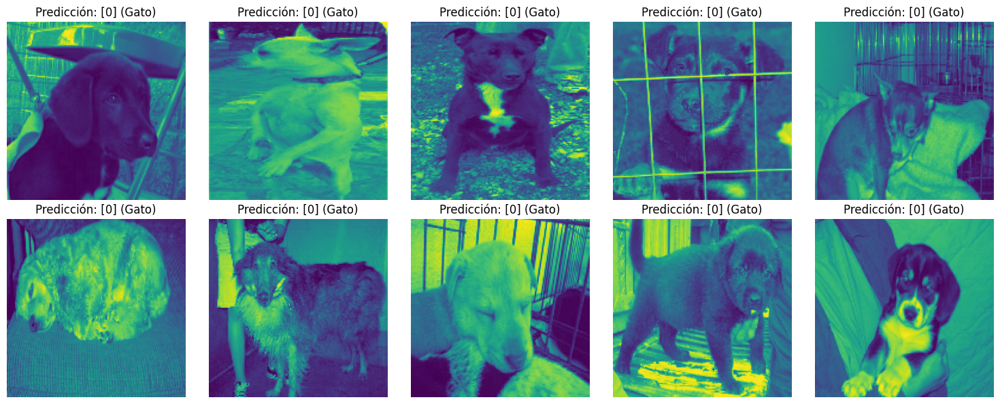

In [ ]:
# Identificar índices de imágenes donde se predijo incorrectamente que es un gato
indices_gato_incorrecto = [i for i, (verdadero, predicho) in enumerate(zip(y_test, predicted_labels)) if verdadero == 1 and predicho == 0]

# Seleccionar índices aleatorios de imágenes de gatos incorrectamente clasificadas
indices_mostrar = random.sample(indices_gato_incorrecto, min(num_ejemplos, len(indices_gato_incorrecto)))

# Mostrar las imágenes
plt.figure(figsize=(15, 6))
for i, idx in enumerate(indices_mostrar, 1):
    plt.subplot(filas, columnas, i)
    plt.imshow(X_test[idx])  # Muestra la imagen
    plt.title(f"Predicción: {predicted_labels[idx]} (Gato)")
    plt.axis('off')
plt.tight_layout()
plt.show()

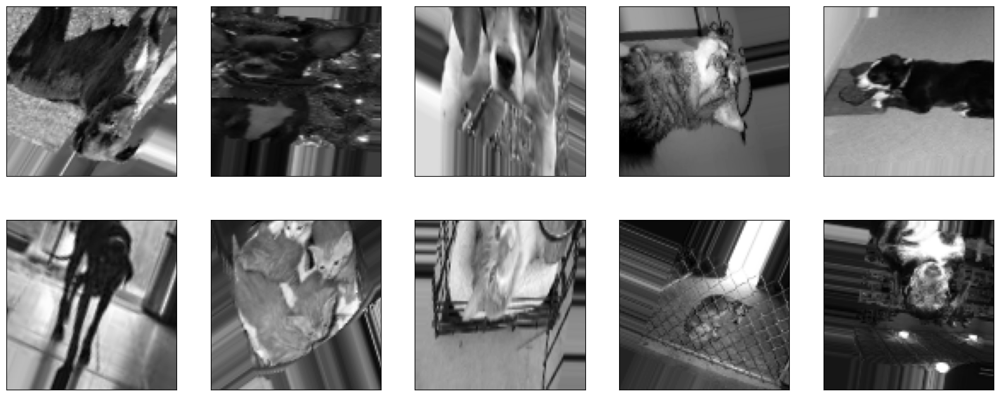

In [ ]:
# Aumento de datos
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=[0.7, 1.4],
    horizontal_flip=True,
    vertical_flip=True
)

datagen.fit(X)

plt.figure(figsize=(20,8))

for imagen, etiqueta in datagen.flow(X, Y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i].reshape(100, 100), cmap="gray")
  break

1/1 [==============================] - 0s 27ms/step
La imagen es un gato.


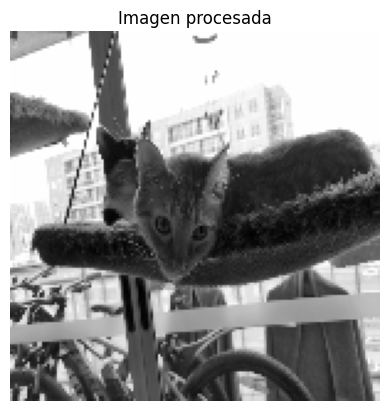

In [12]:
import cv2
import matplotlib.pyplot as plt

def ask(model, image_path):
    # Leer la imagen
    image = cv2.imread(image_path)

    # Redimensionar la imagen
    image = cv2.resize(image, (tamañoimg, tamañoimg))

    # Convertir la imagen a escala de grises
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Ajustar el tamaño de la imagen para que coincida con el formato de entrada del modelo
    image_input = gray_image.reshape(1, tamañoimg, tamañoimg, 1)

    # Realizar la predicción
    predictions = model.predict(image_input)

    # Convertir las probabilidades en etiquetas (0 o 1) si es un problema de clasificación binaria
    predicted_label = 1 if predictions[0][0] > 0.5 else 0


    # Imprimir la etiqueta predicha
    if predicted_label == 0:
        print("La imagen es un perro.")
    else:
        print("La imagen es un gato.")

    # Mostrar la imagen procesada
    plt.imshow(gray_image, cmap='gray')
    plt.title("Imagen procesada")
    plt.axis('off')
    plt.show()

# Llamar a la función ask con la imagen y el modelo
ask(dog_cat_CNN, '/content/gatoPapula.jfif')



